In [424]:
# Importer les packages #
import pandas as pd
import numpy as np
import urllib.request
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import statsmodels
import statsmodels.api as sm
import scipy.stats as stats
from shapely.geometry import Point, Polygon
import folium

In [18]:
# Read des données #
url = "https://static.data.gouv.fr/resources/demandes-de-valeurs-foncieres/20200416-115822/valeursfoncieres-2019.txt"
df = pd.read_csv(url, error_bad_lines=False, delimiter='|')

/Users/nguyenchau/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (18,23,24,26,28,29,31,33,41) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [9]:
# Print les 10 premiers lignes de data#
df.head(n=10)

,Code service CH,Reference document,1 Articles CGI,2 Articles CGI,3 Articles CGI,4 Articles CGI,5 Articles CGI,No disposition,Date mutation,Nature mutation,...,Surface Carrez du 5eme lot,Nombre de lots,Code type local,Type local,Identifiant local,Surface reelle bati,Nombre pieces principales,Nature culture,Nature culture speciale,Surface terrain
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,04/01/2019,Vente,...,NaN,1,2.0,Appartement,NaN,20.0,1.0,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,04/01/2019,Vente,...,NaN,2,2.0,Appartement,NaN,62.0,3.0,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,04/01/2019,Vente,...,NaN,1,3.0,Dépendance,NaN,0.0,0.0,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,08/01/2019,Vente,...,NaN,0,1.0,Maison,NaN,90.0,4.0,S,NaN,940.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,07/01/2019,Vente,...,NaN,0,1.0,Maison,NaN,101.0,5.0,S,NaN,490.0
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,03/01/2019,Vente,...,NaN,0,1.0,Maison,NaN,88.0,4.0,S,NaN,708.0
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,08/01/2019,Vente,...,NaN,0,1.0,Maison,NaN,39.0,2.0,S,NaN,631.0
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,08/01/2019,Vente,...,NaN,0,NaN,NaN,NaN,NaN,NaN,L,NaN,120.0
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,04/01/2019,Vente,...,NaN,1,3.0,Dépendance,NaN,0.0,0.0,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,04/01/2019,Vente,...,NaN,2,2.0,Appartement,NaN,69.0,3.0,NaN,NaN,NaN


In [19]:
print(df.shape)# 2535791 lignes, 43 colonnes #
print(df.columns) # bis / ter / quater

(2535791, 43)
Index(['Code service CH', 'Reference document', '1 Articles CGI',
       '2 Articles CGI', '3 Articles CGI', '4 Articles CGI', '5 Articles CGI',
       'No disposition', 'Date mutation', 'Nature mutation', 'Valeur fonciere',
       'No voie', 'B/T/Q', 'Type de voie', 'Code voie', 'Voie', 'Code postal',
       'Commune', 'Code departement', 'Code commune', 'Prefixe de section',
       'Section', 'No plan', 'No Volume', '1er lot',
       'Surface Carrez du 1er lot', '2eme lot', 'Surface Carrez du 2eme lot',
       '3eme lot', 'Surface Carrez du 3eme lot', '4eme lot',
       'Surface Carrez du 4eme lot', '5eme lot', 'Surface Carrez du 5eme lot',
       'Nombre de lots', 'Code type local', 'Type local', 'Identifiant local',
       'Surface reelle bati', 'Nombre pieces principales', 'Nature culture',
       'Nature culture speciale', 'Surface terrain'],
      dtype='object')


In [51]:
# Examiner le % des valeurs NA dans chaque variable #
num_sum = df.isna().sum()/df.shape[0]*100
num_sum

Code service CH               100.000000
Reference document            100.000000
1 Articles CGI                100.000000
2 Articles CGI                100.000000
3 Articles CGI                100.000000
4 Articles CGI                100.000000
5 Articles CGI                100.000000
No disposition                  0.000000
Date mutation                   0.000000
Nature mutation                 0.000000
Valeur fonciere                 1.153920
No voie                        40.446472
B/T/Q                          95.684621
Type de voie                   41.553898
Code voie                       1.111645
Voie                            1.118152
Code postal                     1.116930
Commune                         0.000000
Code departement                0.000000
Code commune                    0.000000
Prefixe de section             94.998208
Section                         0.002918
No plan                         0.000000
No Volume                      99.738701
1er lot         

In [156]:
# Data_exploration et créer des sous-dataset# 
# Etape 1: Surprimer toutes les variables où le pourcentage des valeurs NA > 90%  #
df1 = df.drop(["Code service CH","Reference document","1 Articles CGI","2 Articles CGI",
               "3 Articles CGI","4 Articles CGI","5 Articles CGI","Nature culture speciale",
               "B/T/Q","Prefixe de section","No Volume","Surface Carrez du 1er lot","Surface Carrez du 2eme lot",
              "Surface Carrez du 2eme lot","Surface Carrez du 2eme lot","Surface Carrez du 3eme lot","Surface Carrez du 4eme lot",
              "Surface Carrez du 5eme lot","Identifiant local","Nature culture speciale","1er lot","2eme lot","3eme lot","4eme lot",
              "5eme lot","Date mutation","No voie","Type de voie","Nature culture","Surface terrain"],axis=1)

In [169]:
df1.head()

,No disposition,Nature mutation,Valeur fonciere,Code voie,Voie,Code postal,Commune,Code departement,Code commune,Section,No plan,Nombre de lots,Code type local,Type local,Surface reelle bati,Nombre pieces principales
0,1,Vente,"37220,00",2730,DE MONTHOLON,1000.0,BOURG-EN-BRESSE,1,53,AI,298,1,2.0,Appartement,20.0,1.0
1,1,Vente,"185100,00",1650,GEN DELESTRAINT,1000.0,BOURG-EN-BRESSE,1,53,AM,95,2,2.0,Appartement,62.0,3.0
2,1,Vente,"185100,00",1650,GEN DELESTRAINT,1000.0,BOURG-EN-BRESSE,1,53,AM,95,1,3.0,Dépendance,0.0,0.0
3,1,Vente,"209000,00",0043,DES CHAMPAGNES,1160.0,PRIAY,1,314,E,1676,0,1.0,Maison,90.0,4.0
4,1,Vente,"134900,00",A003,LE BIOLAY,1370.0,SAINT-ETIENNE-DU-BOIS,1,350,AA,11,0,1.0,Maison,101.0,5.0


In [170]:
# Examiner le nombre des catérogies et leur fréquence de la variable Nature mutation # 
df1["Nature mutation"].value_counts()

Vente                                 2308539
Vente en l'état futur d'achèvement     185441
Echange                                 27127
Vente terrain à bâtir                    7806
Adjudication                             4819
Expropriation                            2059
Name: Nature mutation, dtype: int64

In [171]:
# Examiner le nombre des catérogies et leur fréquence de la variable Type local #
df1["Type local"].value_counts()

Maison                                      515398
Appartement                                 430975
Dépendance                                  312480
Local industriel. commercial ou assimilé     94479
Name: Type local, dtype: int64

In [182]:
#Créer une sous-dataset pour les ventes (nature de la mutation=Vente, hors VEFA) 
#de maison et appartement (code type local=1 ou 2)
df2 = df1[(df1["Nature mutation"]== "Vente") & (df1["Code type local"]<=2)]
print(df2.shape)

(934965, 16)


In [183]:
# Examiner les valeurs NA de la dernier set #
df2.isna().sum()

No disposition                  0
Nature mutation                 0
Valeur fonciere              3608
Code voie                       0
Voie                           38
Code postal                    52
Commune                         0
Code departement                0
Code commune                    0
Section                        31
No plan                         0
Nombre de lots                  0
Code type local                 0
Type local                      0
Surface reelle bati            18
Nombre pieces principales      18
dtype: int64

In [184]:
df2.dtypes

No disposition                 int64
Nature mutation               object
Valeur fonciere               object
Code voie                     object
Voie                          object
Code postal                  float64
Commune                       object
Code departement              object
Code commune                   int64
Section                       object
No plan                        int64
Nombre de lots                 int64
Code type local              float64
Type local                    object
Surface reelle bati          float64
Nombre pieces principales    float64
dtype: object

In [186]:
# Surprimer les valeurs NA #
df2 = df2.dropna()

In [264]:
print(df2.shape)
#print(type(df2["Valeur fonciere"]))

(931218, 17)


In [188]:
# Transformer le type de la variable price en numérique #
price = []
for i in df2["Valeur fonciere"][:df2.shape[0]]:
    a = (i.split(",")[0])
    price.append(float(a))
df2["Valeur fonciere"] = price

In [198]:
# Summary des variables quantitatives #
df2.describe()

,No disposition,Valeur fonciere,Code postal,Code commune,No plan,Nombre de lots,Code type local,Surface reelle bati,Nombre pieces principales
count,931218.000000,9.312180e+05,931218.000000,931218.000000,931218.000000,931218.000000,931218.000000,931218.000000,931218.000000
mean,1.045327,1.350441e+06,54025.099849,209.192549,353.473129,0.546305,1.450901,81.797441,3.477448
std,0.516505,9.792117e+06,27491.440337,170.786982,507.501926,0.863873,0.497584,45.991124,1.611235
min,1.000000,0.000000e+00,1000.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000
25%,1.000000,1.100000e+05,33000.000000,75.000000,77.000000,0.000000,1.000000,50.000000,2.000000
50%,1.000000,1.790000e+05,56130.000000,169.000000,192.000000,0.000000,1.000000,75.000000,3.000000
75%,1.000000,3.003500e+05,77500.000000,301.000000,426.000000,1.000000,2.000000,102.000000,4.000000
max,24.000000,2.086000e+09,97490.000000,909.000000,9757.000000,24.000000,2.000000,1110.000000,67.000000


# Data_exploration

In [235]:
print(len(df2["Commune"].value_counts()))
print(len(df2["Code departement"].value_counts()))

26994
99


In [259]:
# Groupe by par Commune # 
df_commue = df2.groupby(['Commune']).mean().reset_index()
# Top 10 les plus chers de valeur foncier par Commune #
df_commue.sort_values(by="Valeur fonciere",ascending=False).head(n=10)
#df_geo_neighbourhood[["Valeur fonciere","Surface reelle bati","Nomber pieces principales"]]

,Commune,No disposition,Valeur fonciere,Code postal,Code commune,No plan,Nombre de lots,Code type local,Surface reelle bati,Nombre pieces principales,log_valeur_foncier
18091,PLOUGOURVEST,1.000000,3.889747e+08,29400.00000,193.0,869.000000,0.000000,1.000000,107.333333,4.111111,13.576089
18131,PLOUZEVEDE,1.055556,2.318723e+08,29440.00000,213.0,166.944444,0.000000,1.000000,120.000000,4.722222,12.597196
4257,CASTELNAU LE LEZ,1.000000,1.313654e+08,34170.00000,57.0,153.361011,0.155235,1.891697,66.462094,2.960289,17.377392
15807,MONTFERRIER-SUR-LEZ,1.000000,1.312123e+08,34980.00000,169.0,106.027778,0.750000,1.750000,80.416667,3.416667,17.425402
19765,RUNGIS,1.000000,1.115889e+08,94150.00000,65.0,217.161538,0.684615,1.861538,52.030769,2.384615,15.632983
17867,PIGNAN,1.000000,1.098211e+08,34570.00000,202.0,330.078431,0.137255,1.784314,79.647059,3.607843,16.514859
13676,LONGJUMEAU,1.001197,6.587613e+07,91160.00000,345.0,567.332735,0.197487,1.931777,68.587672,3.429683,17.096331
26252,VILLEJUIF,1.001414,5.516288e+07,94800.00000,76.0,137.437058,0.990099,1.838755,50.753890,2.456860,14.037280
7740,ERAGNY-SUR-OISE,1.033233,5.356859e+07,95610.00000,218.0,209.909366,0.764350,1.655589,69.921450,3.205438,13.867308
14734,MAUGUIO,1.000000,5.063466e+07,34156.28866,154.0,153.773196,0.546392,1.649485,70.969072,3.123711,14.092163


# Data transformation 

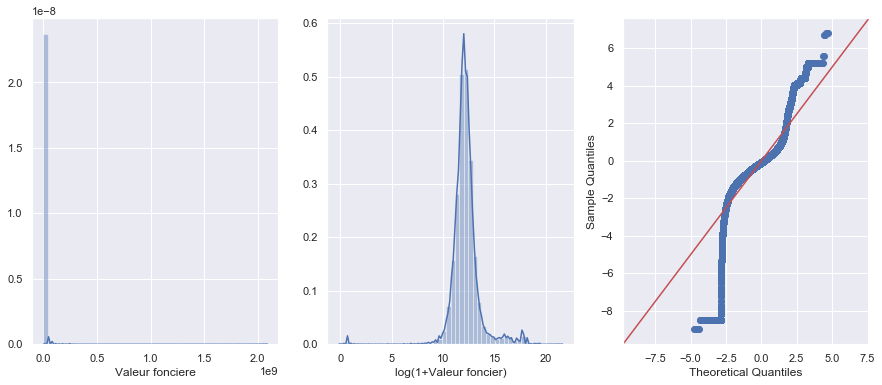

In [207]:
# Distribution de la variable Valeur fonciere et log(1+ Valeur foncier)
# On voit bien que cette variable suit la loi Log_normale, mais il faut excluse des valeurs outliers 
#dans cette variable

fig, axes = plt.subplots(1,3, figsize=(15,6))
sns.distplot(df2['Valeur fonciere'], ax=axes[0])
sns.distplot(np.log1p(df2['Valeur fonciere']), ax=axes[1])
axes[1].set_xlabel('log(1+Valeur foncier)')
sm.qqplot(np.log1p(df2['Valeur fonciere']), stats.norm, fit=True, line='45', ax=axes[2]);

In [220]:
# Créer une nouvelle variable log valeur foncier # 
df2["log_valeur_foncier"] = np.log1p(df2["Valeur fonciere"])

In [273]:
print(len(df2[df2["log_valeur_foncier"]<=9])) # Le nombre des observartions où les log_valeurs_fonciers <= 5
print(len(df2[df2["log_valeur_foncier"]>15])) # Le nombre des observartions où les log_valeurs_fonciers >= 15

6109
35314


In [338]:
# Enlever les outliers # 
df_fn = df2[(df2["log_valeur_foncier"]>10)& (df2["log_valeur_foncier"]<=14)]

In [339]:
df_fn.head()

,No disposition,Nature mutation,Valeur fonciere,Code voie,Voie,Code postal,Commune,Code departement,Code commune,Section,No plan,Nombre de lots,Code type local,Type local,Surface reelle bati,Nombre pieces principales,log_valeur_foncier
0,1,Vente,37220.0,2730,DE MONTHOLON,1000.0,BOURG-EN-BRESSE,1,53,AI,298,1,2.0,Appartement,20.0,1.0,10.524628
1,1,Vente,185100.0,1650,GEN DELESTRAINT,1000.0,BOURG-EN-BRESSE,1,53,AM,95,2,2.0,Appartement,62.0,3.0,12.128657
3,1,Vente,209000.0,0043,DES CHAMPAGNES,1160.0,PRIAY,1,314,E,1676,0,1.0,Maison,90.0,4.0,12.250094
4,1,Vente,134900.0,A003,LE BIOLAY,1370.0,SAINT-ETIENNE-DU-BOIS,1,350,AA,11,0,1.0,Maison,101.0,5.0,11.812296
5,1,Vente,192000.0,0445,DES LIBELLULES,1340.0,ATTIGNAT,1,24,AI,94,0,1.0,Maison,88.0,4.0,12.165256


In [376]:
len(df_fn["Code departement"].value_counts()) # 99 département #

99

In [340]:
df_fn.shape

(862931, 17)

In [412]:
# Importer les données longtitude et latitude # 
geo = pd.read_csv("laposte_hexasmal.csv" ,sep=";")
geo.head()

,Code_commune_INSEE,Nom_commune,Code_postal,Ligne_5,Libellé_d_acheminement,coordonnees_gps
0,01006,AMBLEON,1300,NaN,AMBLEON,"45.7494989044,5.59432017366"
1,01007,AMBRONAY,1500,NaN,AMBRONAY,"46.0055913782,5.35760660735"
2,01014,ARBENT,1100,NaN,ARBENT,"46.2834936005,5.69061651221"
3,01015,ARBOYS EN BUGEY,1300,ARBIGNIEU,ARBOYS EN BUGEY,"45.7237621545,5.65263086429"
4,01016,ARBIGNY,1190,NaN,ARBIGNY,"46.4776762988,4.9599416863"


In [413]:
# Split la variable longtitude et latitude à partir de la variable geo_point_2d # 
latitude = []
longtitude = []
for i in geo["coordonnees_gps"]:
    try:
        latitude.append(float(i.split(",")[0]))
        longtitude.append(float(i.split(",")[1]))
    except:
        latitude.append(0)
        longtitude.append(0)
geo["latitude"] = latitude
geo["longtitude"] = longtitude

In [414]:
geo.head()

,Code_commune_INSEE,Nom_commune,Code_postal,Ligne_5,Libellé_d_acheminement,coordonnees_gps,latitude,longtitude
0,01006,AMBLEON,1300,NaN,AMBLEON,"45.7494989044,5.59432017366",45.749499,5.594320
1,01007,AMBRONAY,1500,NaN,AMBRONAY,"46.0055913782,5.35760660735",46.005591,5.357607
2,01014,ARBENT,1100,NaN,ARBENT,"46.2834936005,5.69061651221",46.283494,5.690617
3,01015,ARBOYS EN BUGEY,1300,ARBIGNIEU,ARBOYS EN BUGEY,"45.7237621545,5.65263086429",45.723762,5.652631
4,01016,ARBIGNY,1190,NaN,ARBIGNY,"46.4776762988,4.9599416863",46.477676,4.959942


In [416]:
# Groupe by longtitude et latitude par Code département # 
geo = geo[["Code_postal","latitude","longtitude"]]
geo = geo.groupby(['Code_postal']).mean().reset_index()

In [324]:
#fig = plt.figure(figsize = (15,10))
#ax = fig.gca()
#df_fn.hist(ax=ax)
#plt.show()

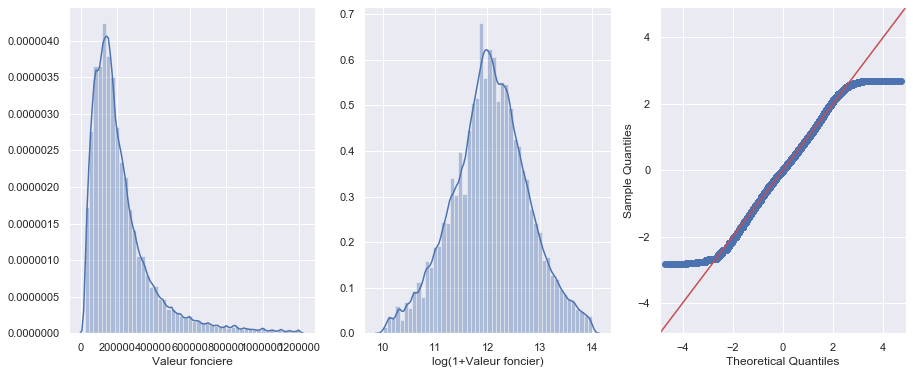

In [323]:
fig, axes = plt.subplots(1,3, figsize=(15,6))
sns.distplot(df_fn['Valeur fonciere'], ax=axes[0])
sns.distplot(np.log1p(df_fn['Valeur fonciere']), ax=axes[1])
axes[1].set_xlabel('log(1+Valeur foncier)')
sm.qqplot(np.log1p(df_fn['Valeur fonciere']), stats.norm, fit=True, line='45', ax=axes[2]);

In [ ]:
# Département: 75 Commune: ville (Paris)
# Département : Ile et Vilein (35), comune : Rennes , Saint Malo, Saint Briac...
# Section : un ou plus quatiers une ville # 
# Zone rurale: province (campagne) => le lieu où les grandes entreprises qui instellent 
# Zone urbaine : 
# Appartement peuvent avoir plus lots (Mimi a 2 lots: 1 lot pour appart et 1 lot pour la cave)
# Surface Carrez : 
#Surface réelle bâti : surface au sol entre les mur (prend pas en compte de surface de mur)
# Surface terrain : 

In [308]:
# Calculer les fréquences de département dans le dataset # 
depart_fr = df_fn["Code departement"].value_counts().reset_index()
# Rename des colonnes # 
depart_fr = depart_fr.rename({"index":"departement","Code departement":"Frequence"},axis=1)

In [321]:
# Groupe by par Code departement #
df_depart = df_fn.groupby(['Code departement']).mean().reset_index()
df_depart.head()

# Jointure avec le dataset fréquence de département
df_depart = df_depart.merge(depart_fr,left_on="Code departement",right_on="departement")
df_depart = df_depart.drop("departement",axis=1)

In [478]:
# Boucle pour mise en forme le code de département #
a = []
for i in df_depart["Code departement"]:
    if i==1:
        a.append("01")
    elif i==2:
        a.append("02")
    elif i==3:
        a.append("03")
    elif i==4:
        a.append("04")
    elif i==5:
        a.append("05")
    elif i==6:
        a.append("06")
    elif i==7:
        a.append("07")
    elif i==8:
        a.append("08")
    elif i==9:
        a.append("09")
    else:
        a.append(str(i))
df_depart["Code departement"] = a

In [481]:
# Top 10 les plus chers de valeur foncier par département #
df_depart.sort_values(by="Valeur fonciere",ascending=False).head(n=10)

,Code departement,No disposition,Valeur fonciere,Code postal,Code commune,No plan,Nombre de lots,Code type local,Surface reelle bati,Nombre pieces principales,log_valeur_foncier,Frequence
70,75,1.001795,454230.383224,75013.848851,113.848851,52.000563,1.640396,1.998205,45.014502,2.179978,12.845733,28409
87,92,1.004598,416687.798795,92259.218065,33.878125,149.893082,1.528566,1.886264,60.641457,2.820834,12.769768,18921
97,2B,1.230769,393423.923077,20252.000000,133.153846,744.769231,0.692308,1.692308,82.076923,3.538462,12.798947,13
73,78,1.033587,343995.913124,78433.899509,375.476173,350.593706,0.848474,1.510482,86.668816,3.770930,12.563288,22181
89,94,1.007436,341591.774663,94315.179221,47.817302,155.935534,1.240745,1.752300,65.391718,3.068051,12.561787,18692
96,2A,1.022279,305783.107969,20103.915167,111.489289,710.011997,0.914310,1.652099,79.774636,3.189374,12.383136,1167
64,69,1.042081,296972.196311,69304.583804,209.352166,281.203390,0.958374,1.624651,84.456069,3.519774,12.398205,15399
5,06,1.007556,284812.410841,6307.663907,75.190037,248.523008,1.221257,1.835845,63.645265,2.645989,12.326166,22101
69,74,1.030723,282747.616735,74362.178961,165.542404,1636.844825,1.048421,1.671528,71.624664,3.129407,12.320044,7063
31,33,1.045825,280999.579677,33406.224094,227.334352,379.630377,0.414337,1.362279,86.151423,3.525736,12.342005,32406


In [480]:
df_depart.shape # 99 #

(99, 12)

In [501]:
# Importer le contour des departement en France #
import json
contour = json.load(open("departements.geojson"))

In [507]:
fr = folium.Map(location = [46.227638, 2.213749], zoom_start = 6.5)
#fr
fr.choropleth(geo_data=contour,key_on="feature.properties.code",
                            data = df_depart,columns =["Code departement","Valeur fonciere"],
                            fill_color = 'Spectral',
                            nan_fill_color="white",
                            fill_opacity=0.8,
                            line_opacity=0.2,
                            highlight=True,
                            legend_name = "Valeur foncier par departement en France")
fr

In [508]:
fr.save("carte_fr_choropleth_parlant_valeur_foncier.html")

In [514]:
# Map with GeoJson
import geopandas as gpd
# Carte 
geo_dep = gpd.read_file("departements.geojson")
geo_dep = geo_dep.merge(df_depart[["Code departement","Valeur fonciere","Frequence"]], left_on="code", right_on="Code departement")

In [515]:
geo_dep.head()

,code,nom,geometry,Code departement,Valeur fonciere,Frequence
0,01,Ain,"POLYGON ((4.78021 46.17668, 4.78024 46.18905, ...",01,240546.790277,6747
1,02,Aisne,"POLYGON ((3.17296 50.01131, 3.17382 50.01186, ...",02,132419.790562,6188
2,03,Allier,"POLYGON ((3.03207 46.79491, 3.03424 46.79080, ...",03,121381.705935,3353
3,04,Alpes-de-Haute-Provence,"POLYGON ((5.67604 44.19143, 5.67817 44.19051, ...",04,175699.334520,3372
4,05,Hautes-Alpes,"POLYGON ((6.26057 45.12685, 6.26417 45.12641, ...",05,162258.973201,2612


In [534]:
# Create colormap
colormap = folium.LinearColormap(colors=["green","yellow","orange","red"], vmin=min(df_depart["Valeur fonciere"]), vmax=max(df_depart["Valeur fonciere"]))
colormap.caption = "Valeur fonciere par département "

# Create map (looks like a choropleth)
# tooltip : what we want in pop-ups
mapp = folium.Map(location=[46.724303, 2.496909], zoom_start=6, prefer_canvas=True)

# Departement
folium.GeoJson(data=geo_dep[['geometry',"nom", "Code departement", "Valeur fonciere","Frequence"]],
               style_function=lambda x: {"weight":0.2, 'color':'black','fillColor':colormap(x['properties']["Valeur fonciere"]), 'fillOpacity':0.7},
               highlight_function=lambda x: {'weight':0.5, 'color':'black'},
               smooth_factor=2.0,
               tooltip=folium.features.GeoJsonTooltip(fields=["nom","Code departement", "Valeur fonciere","Frequence"],
                                                      aliases=["Departement",
                                                                "Code departement",
                                                                "Valeur fonciere",
                                                                "Frequence de cet departement dans le dataset"], 
                                                       labels=True, 
                                                       sticky=True)).add_to(mapp)


colormap.add_to(mapp)
mapp

#mapp.save("carte_fr_choropleth_valeur_foncier_moyenne_dep.html")

In [535]:
mapp.save("carte_fr_choropleth_valeur_foncier_moyenne_dep.html")

In [ ]:
# Modeling # 
# Regrouper les variables explicatives en 2 groupes :
cat = len(s_df.select_dtypes(include=['object']).columns) # Groupe des variables qualitatives #
num = len(s_df.select_dtypes(include=['int64','float64']).columns) # Groupe des variables numériques #
print('Total Features: ', cat, 'categorical', '+',
      num, 'numerical', '=', cat+num, 'features')